In [1]:
%load_ext autoreload
%autoreload 2
import warnings
import numpy as np
import time
import os
from dotenv import load_dotenv
os.environ["USE_PYGEOS"] = "0"
import napari_sparrow as nas
from spatialdata import read_zarr
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from random import sample 
import scanpy as sc
import seaborn as sns
import anndata as ad
%run own_and_modified_functions.ipynb
warnings.simplefilter(action='ignore')

the value of the environment variable BASIC_DCT_BACKEND is not in ["JAX","SCIPY"]


In [2]:
OUTPUT_DIR = '/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data'
sdata = read_zarr( os.path.join(  OUTPUT_DIR, 'sdata.zarr'  ) )
anndata = sc.read('/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/anndataNucA11') # reset original anndata
# delete anndata
del sdata.table
# create anndata
sdata.table = anndata

In [3]:
n_pca = np.count_nonzero(sdata.table.uns['pca']['variance_ratio'] > 0.01)
make_umap(sdata,n_PCAs=n_pca,n_neighbors=15) # umap only used for the visualization, does not have an effect on the annotation with 'score_genes'

In [4]:
path_mg = "/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL.csv"

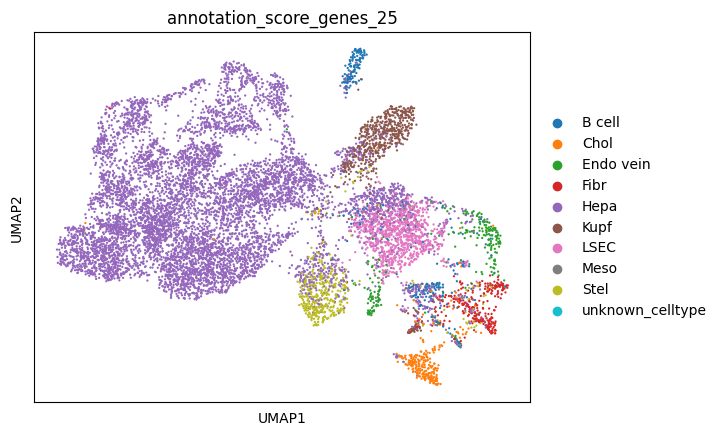

               atlas
B cell      0.621451
Chol        2.673310
Hepa       57.998500
Kupf        3.203686
LSEC        9.241401
Meso        2.796528
Endo vein   3.166185
Fibr        3.042966
Stel       13.768349
Unknown     3.487625
                  annotation_score_genes_25
B cell                             2.858924
Chol                               2.538297
Endo vein                          2.324546
Fibr                               2.502672
Hepa                              71.214820
Kupf                               5.504097
LSEC                               9.164589
Meso                               0.062344
Stel                               3.794086
unknown_celltype                   0.035625


In [5]:
# Original score_genes
mg_dict, scoresper_cluster = score_genes_bins(
    sdata = sdata,
    path_marker_genes = path_mg,
    bins = 25)
visualize_classification(sdata,'annotation_score_genes_25','umap_23_15',"/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL.csv",plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)

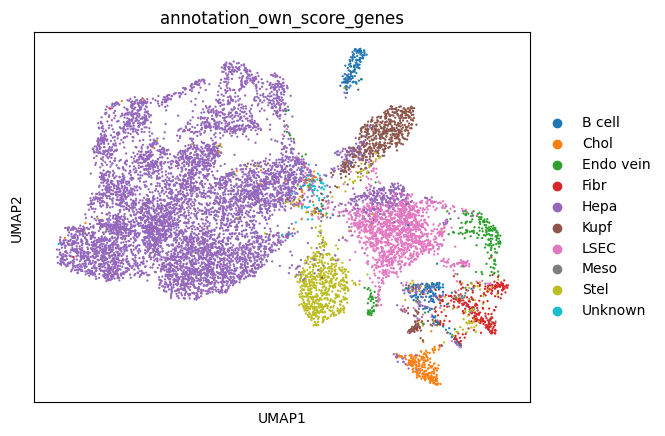

               atlas
B cell      0.621451
Chol        2.673310
Hepa       57.998500
Kupf        3.203686
LSEC        9.241401
Meso        2.796528
Endo vein   3.166185
Fibr        3.042966
Stel       13.768349
Unknown     3.487625
           annotation_own_score_genes
B cell                       2.475953
Chol                         2.280014
Endo vein                    2.110794
Fibr                         2.707517
Hepa                        64.410403
Kupf                         5.860349
LSEC                        12.762736
Meso                         0.409690
Stel                         6.376915
Unknown                      0.605629


,Hepa,LSEC,Endo vein,Chol,Kupf,Stel,Fibr,B cell,Meso
0,0.518377,0.006058,0.030701,0.085765,0.021587,NaN,0.034497,NaN,NaN
1,NaN,0.077458,0.003792,NaN,0.373149,NaN,0.231369,NaN,0.492883
2,NaN,NaN,0.001595,NaN,0.023841,NaN,0.232491,NaN,0.672062
3,0.195218,NaN,NaN,0.036456,NaN,NaN,0.122768,NaN,0.214938
4,0.248247,NaN,NaN,0.069145,NaN,0.052458,0.032160,NaN,NaN
...,...,...,...,...,...,...,...,...,...
11223,0.322433,NaN,NaN,0.059235,NaN,0.054651,0.029201,NaN,NaN
11224,0.516080,NaN,NaN,0.081015,0.065312,0.067269,0.041674,NaN,NaN
11225,0.348373,0.007146,NaN,0.058203,0.049473,NaN,NaN,NaN,NaN
11226,NaN,0.072516,NaN,NaN,0.062516,0.628982,0.337339,NaN,NaN


In [6]:
# Own score genes, just the MinMax scaling
scores = own_score_genes(sdata.table,path_mg)
visualize_classification(sdata,'annotation_own_score_genes','umap_23_15',path_mg,plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)
scores

Hepa         0.644104
LSEC         0.127627
Stel         0.063769
Kupf         0.058603
Fibr         0.027075
B cell       0.024760
Chol         0.022800
Endo vein    0.021108
Unknown      0.006056
Meso         0.004097
Name: annotation_own_score_genes, dtype: float64


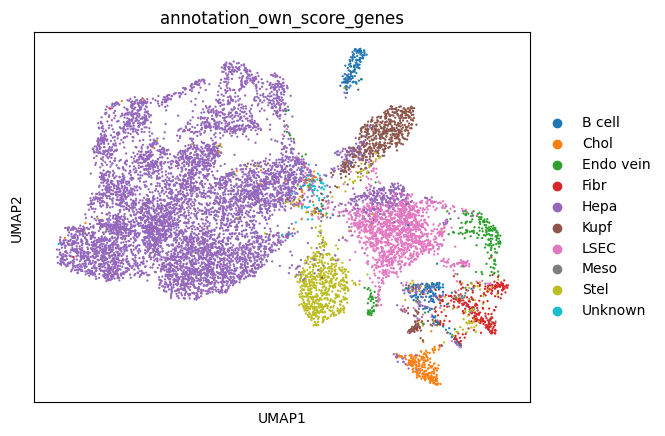

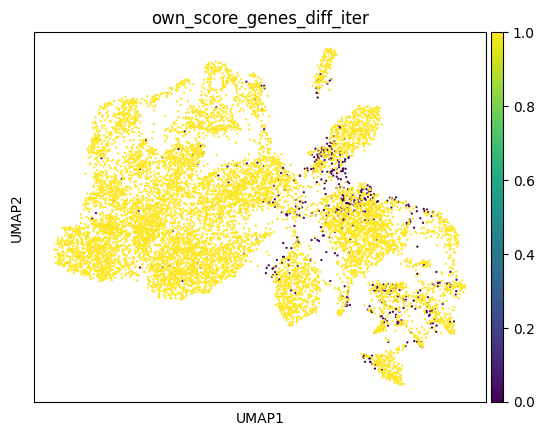

0.05228001425008906


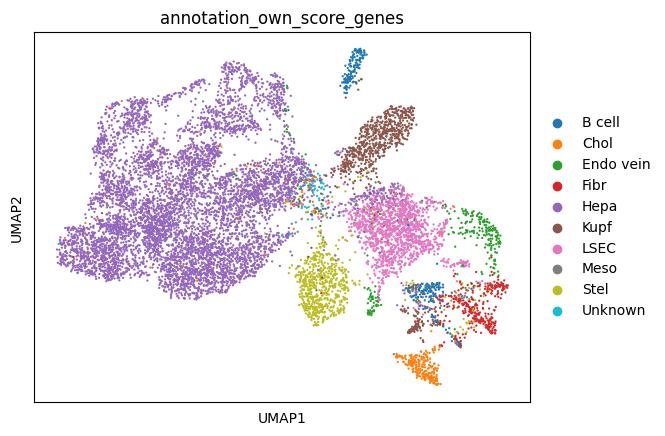

Hepa         0.616227
LSEC         0.127182
Kupf         0.075169
Stel         0.060385
Fibr         0.029747
B cell       0.028767
Chol         0.027164
Endo vein    0.025294
Unknown      0.006056
Meso         0.004008
Name: annotation_own_score_genes, dtype: float64


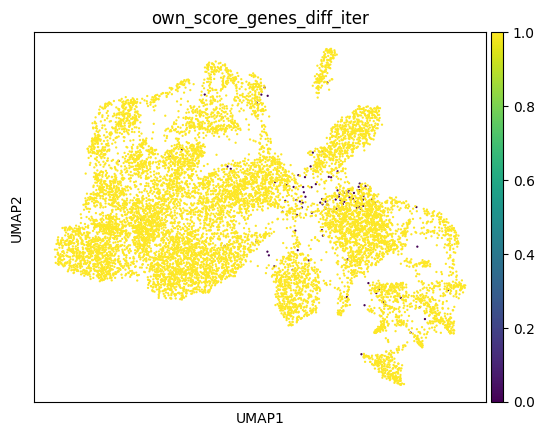

0.00952974706091913


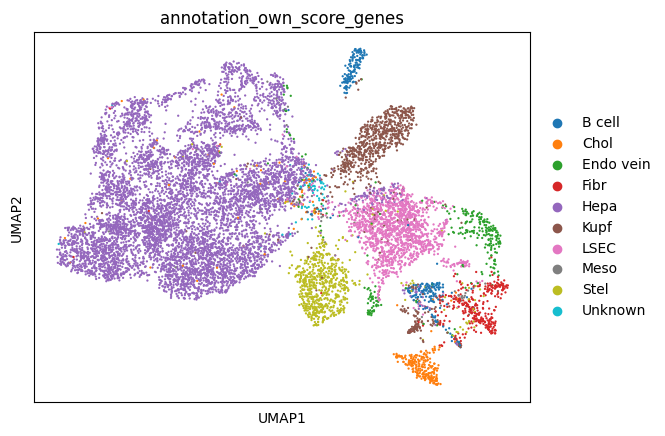

Hepa         0.609904
LSEC         0.130834
Kupf         0.077663
Stel         0.059939
Fibr         0.029925
B cell       0.028589
Chol         0.027342
Endo vein    0.025561
Unknown      0.006056
Meso         0.004186
Name: annotation_own_score_genes, dtype: float64


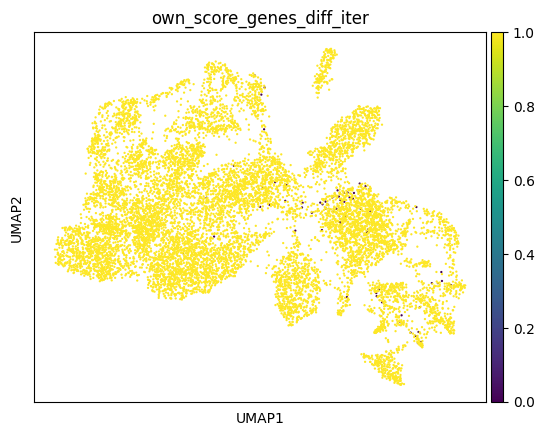

0.006056287851799074


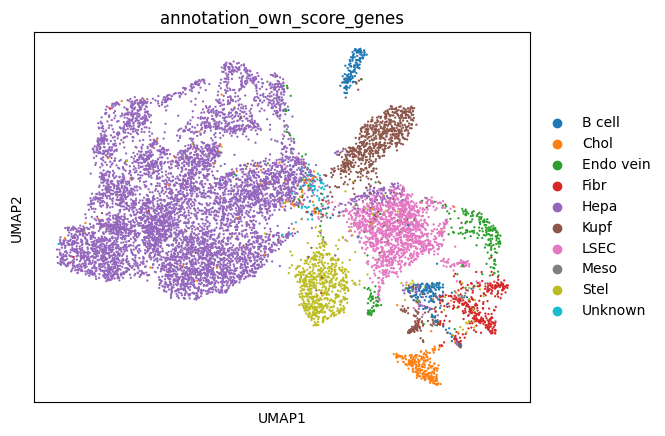

Hepa         0.611685
LSEC         0.127538
Kupf         0.078643
Stel         0.059850
Fibr         0.030549
B cell       0.028322
Chol         0.028233
Endo vein    0.024581
Unknown      0.006056
Meso         0.004542
Name: annotation_own_score_genes, dtype: float64


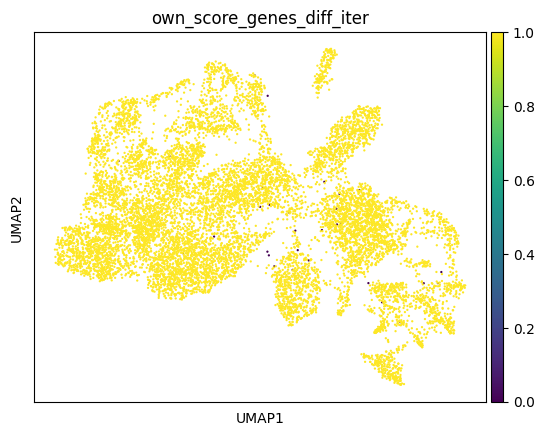

0.0026718916993231207


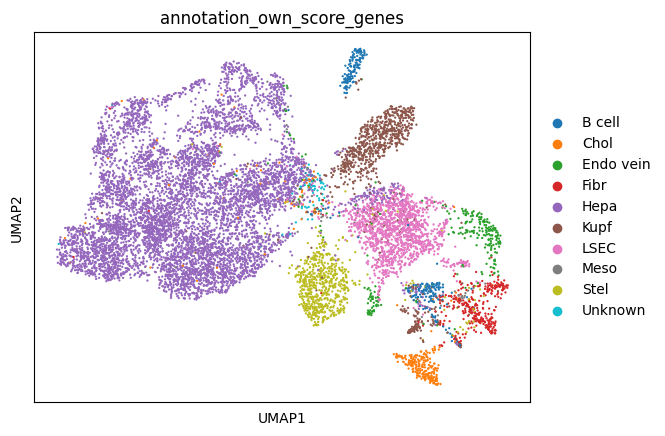

Hepa         0.613288
LSEC         0.127449
Kupf         0.078910
Stel         0.058514
Fibr         0.030281
B cell       0.028411
Chol         0.027788
Endo vein    0.024938
Unknown      0.006056
Meso         0.004364
Name: annotation_own_score_genes, dtype: float64


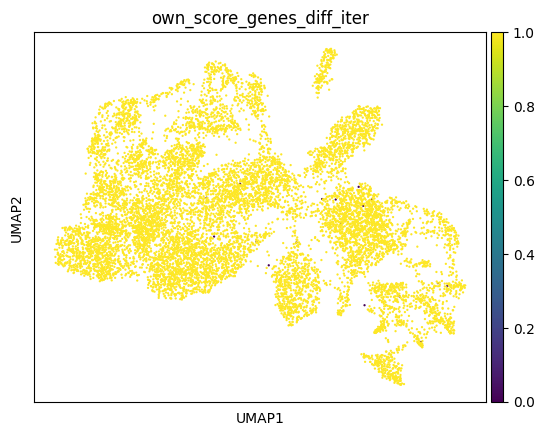

0.0015140719629497684


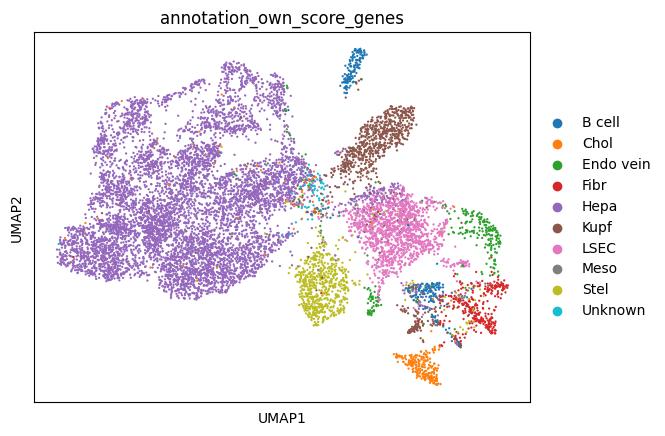

Hepa         0.613823
LSEC         0.127004
Kupf         0.079444
Stel         0.058336
Fibr         0.030103
B cell       0.028500
Chol         0.027520
Endo vein    0.024760
Unknown      0.006056
Meso         0.004453
Name: annotation_own_score_genes, dtype: float64


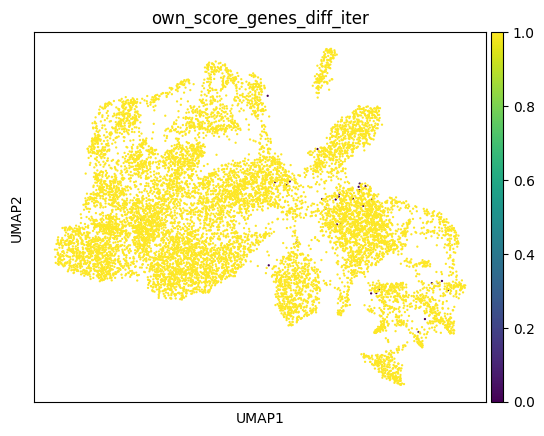

0.002939080869255433


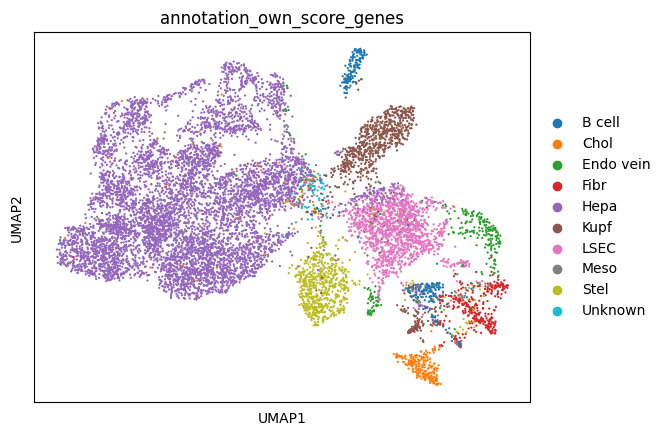

Hepa         0.611952
LSEC         0.128429
Kupf         0.079533
Stel         0.058871
Fibr         0.029391
B cell       0.028767
Chol         0.027431
Endo vein    0.025116
Unknown      0.006056
Meso         0.004453
Name: annotation_own_score_genes, dtype: float64


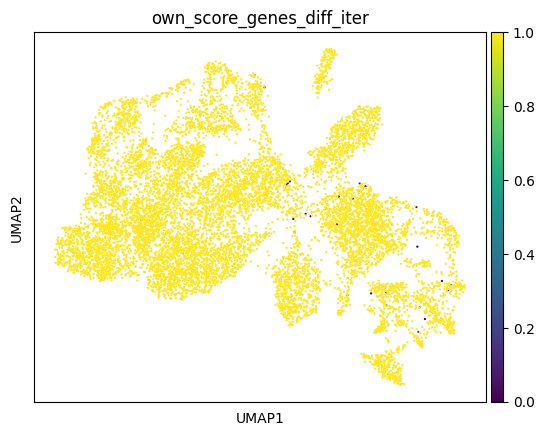

0.003028143925899537


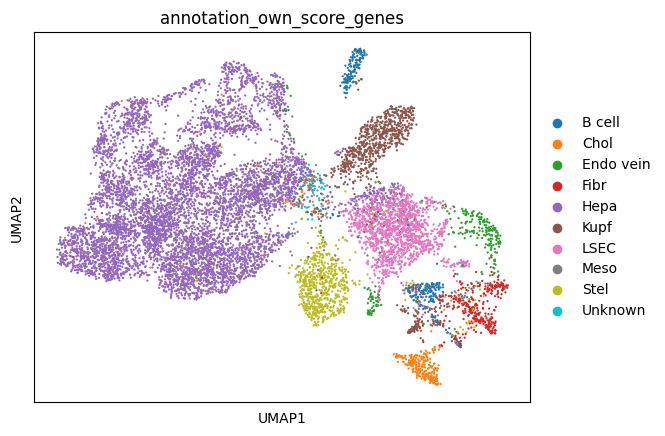

Hepa         0.612309
LSEC         0.126915
Kupf         0.079355
Stel         0.058425
Fibr         0.029925
B cell       0.029302
Chol         0.027075
Endo vein    0.025917
Unknown      0.006056
Meso         0.004720
Name: annotation_own_score_genes, dtype: float64


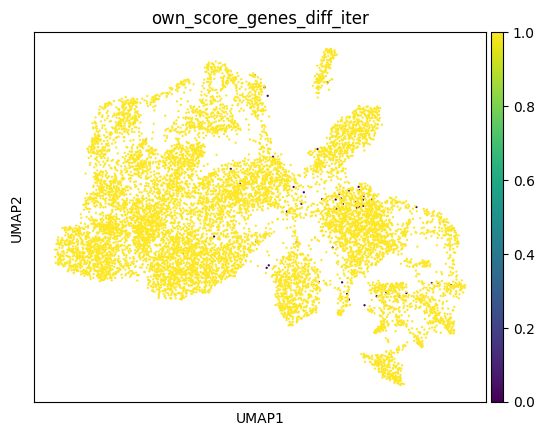

0.004631278945493409


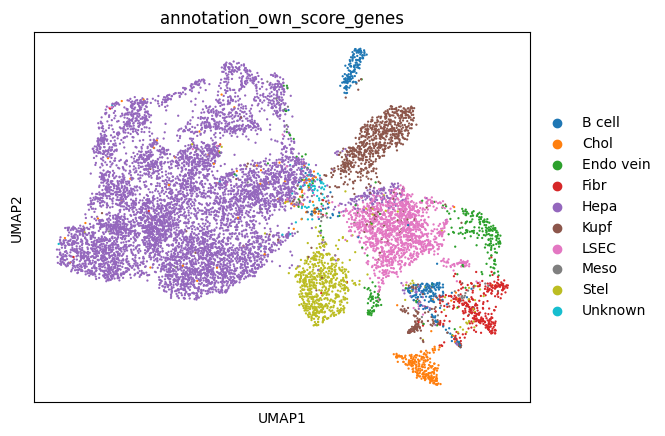

Hepa         0.614891
LSEC         0.124510
Kupf         0.078465
Stel         0.058158
Fibr         0.030281
B cell       0.029658
Chol         0.027699
Endo vein    0.025828
Unknown      0.006056
Meso         0.004453
Name: annotation_own_score_genes, dtype: float64


[0.05228001425008906,
 0.00952974706091913,
 0.006056287851799074,
 0.0026718916993231207,
 0.0015140719629497684,
 0.002939080869255433,
 0.003028143925899537,
 0.004631278945493409]

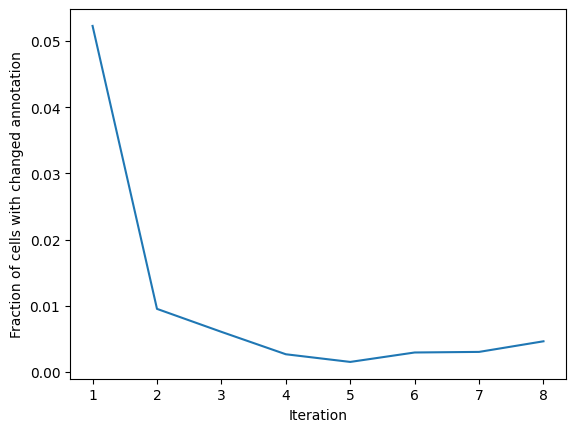

In [7]:
# Own score genes iterative
own_score_genes_iterative(sdata.table,path_mg,nr_iterations=8)

In [8]:
sdata.table.obs.columns

Index(['region', 'instance', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_2_genes',
       'pct_counts_in_top_5_genes', 'n_counts', 'shapeSize',
       'annotation_score_genes_25', 'cleanliness_score_genes_25',
       'score_celltype_own_score_genes',
       'second_score_celltype_own_score_genes', 'cleanliness_own_score_genes',
       'own_score_genes_diff_iter', 'annotation_own_score_genes_previous',
       'annotation_own_score_genes'],
      dtype='object')

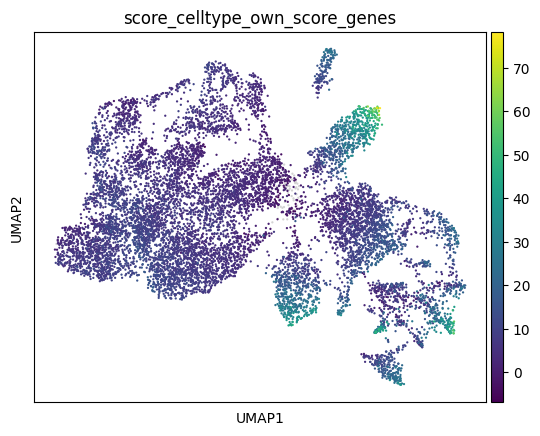

In [9]:
sc.pl.umap(sdata.table,color=['score_celltype_own_score_genes'])

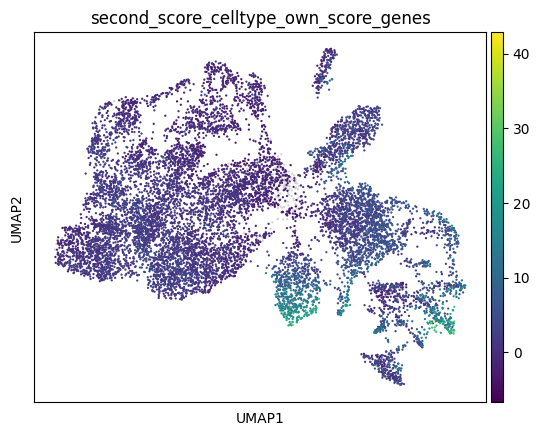

In [10]:
sc.pl.umap(sdata.table,color=['second_score_celltype_own_score_genes'])

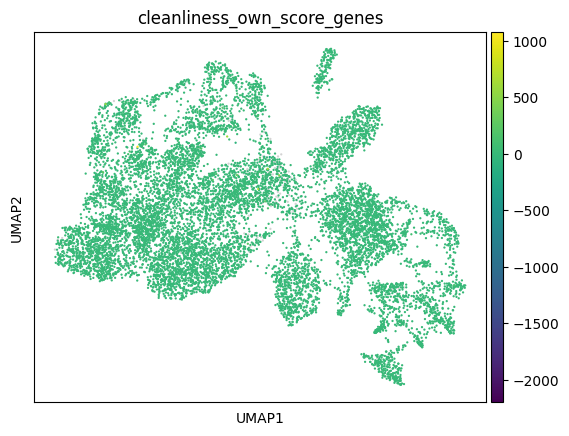

In [11]:
sc.pl.umap(sdata.table,color=['cleanliness_own_score_genes'])

Hepa          8.669
LSEC          9.333
Endo vein     7.250
Chol          7.500
Kupf         19.500
Stel         16.001
Fibr         17.625
B cell        4.500
Meso          6.000
dtype: float64


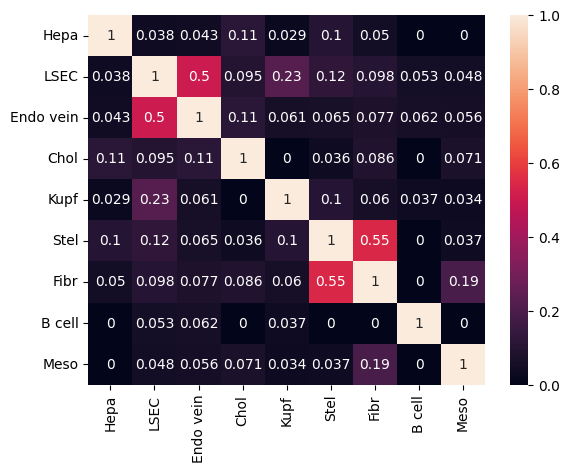

In [12]:
Jaccard_similarity_matrix(path_mg)

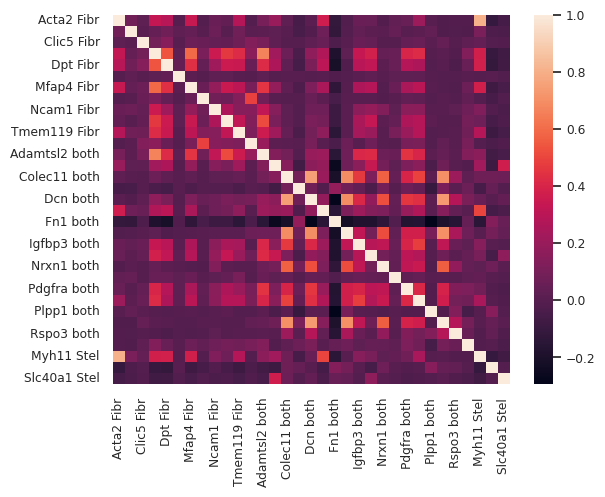

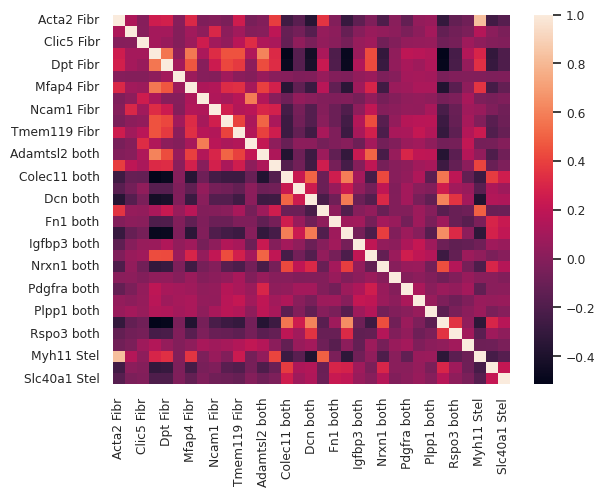

In [13]:
# plot correlation matrix of the gene expression of the marker genes of 2 confused cell types
# confusion between fibroblasts and stellate cells
# expression of all cells
sns.set(font_scale=0.8)
correlation_matrix_expression_marker_genes_of_2_cell_types(sdata.table,path_mg,'Fibr','Stel')
plt.show()
# expression of cells that are classified as fibroblasts or stellate cells
adata_sub = sdata.table[(sdata.table.obs['annotation_own_score_genes'] == 'Fibr') | (sdata.table.obs['annotation_own_score_genes'] == 'Stel'),:]
correlation_matrix_expression_marker_genes_of_2_cell_types(adata_sub,path_mg,'Fibr','Stel')

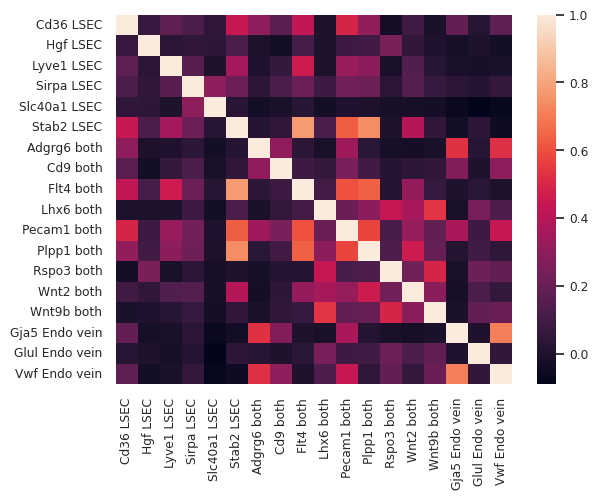

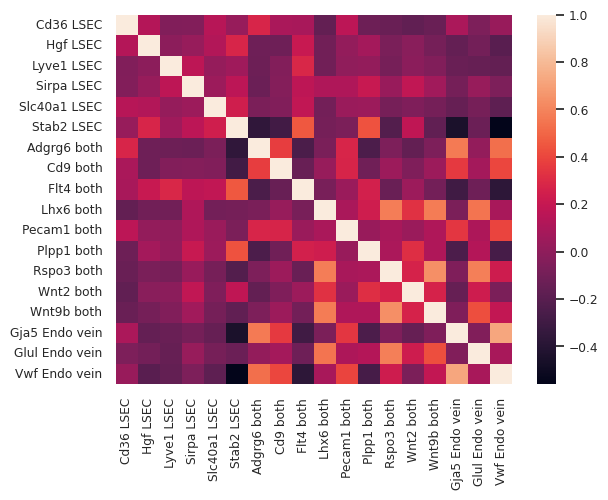

In [14]:
# plot correlation matrix of the gene expression of the marker genes of 2 confused cell types
# confusion between LSECs and Endo vein cells
# expression of all cells
correlation_matrix_expression_marker_genes_of_2_cell_types(sdata.table,path_mg,'LSEC','Endo vein')
plt.show()
# expression of cells that are classified as fibroblasts or stellate cells
adata_sub = sdata.table[(sdata.table.obs['annotation_own_score_genes'] == 'LSEC') | (sdata.table.obs['annotation_own_score_genes'] == 'Endo vein'),:]
correlation_matrix_expression_marker_genes_of_2_cell_types(adata_sub,path_mg,'LSEC','Endo vein')

<AxesSubplot: >

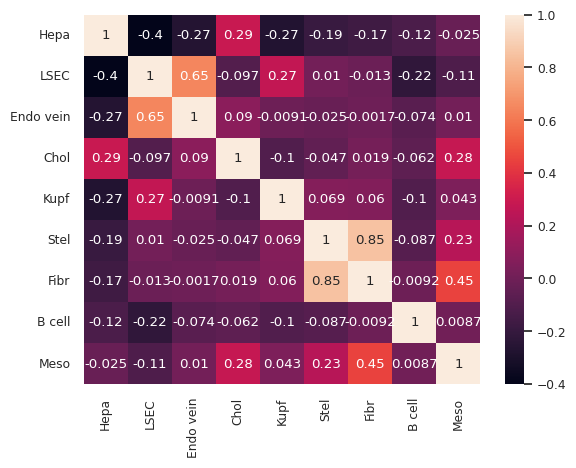

In [15]:
# plot correlation matrix of the features
sns.heatmap(scores.corr(method='pearson'), annot=True)
# sns.heatmap(scores_minmax.corr(method='pearson'), annot=True) gives the same heatmap

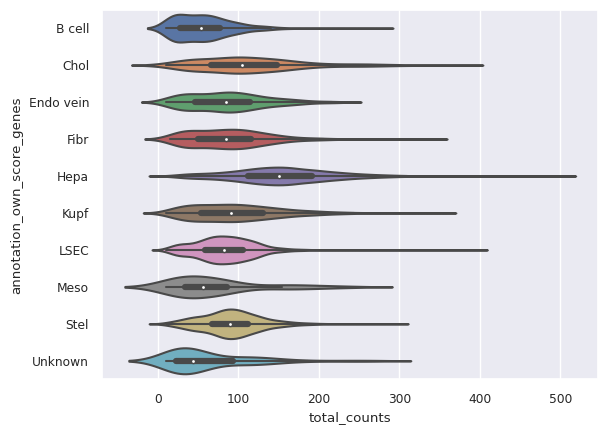

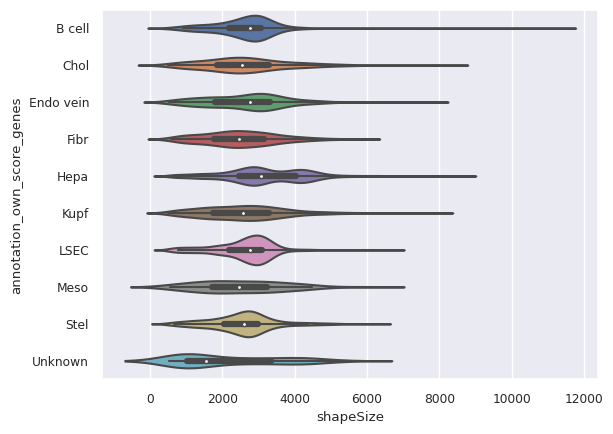

<AxesSubplot: xlabel='count_density', ylabel='annotation_own_score_genes'>

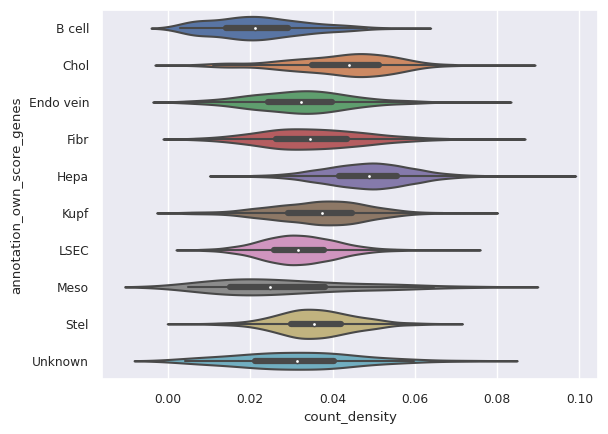

In [16]:
sns.violinplot(data=sdata.table.obs,x="total_counts",y="annotation_own_score_genes")
plt.show()
sns.violinplot(data=sdata.table.obs,x="shapeSize",y="annotation_own_score_genes")
plt.show()
sdata.table.obs['count_density'] = sdata.table.obs['total_counts'] / sdata.table.obs['shapeSize']
sns.violinplot(data=sdata.table.obs,x="count_density",y="annotation_own_score_genes")

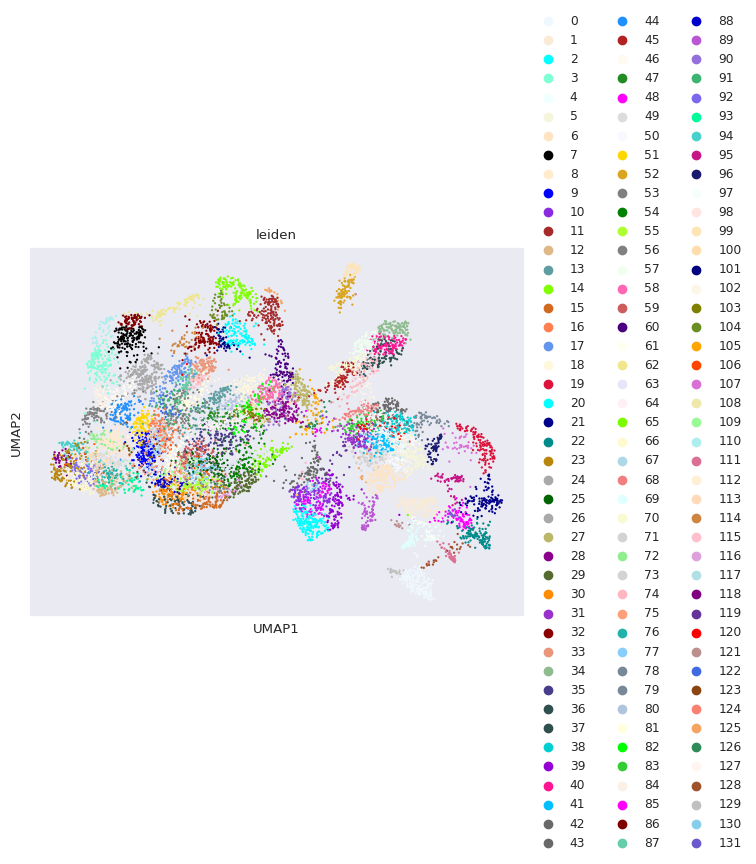

In [17]:
sc.tl.leiden(sdata.table,resolution=10,key_added='leiden')
sc.pl.umap(sdata.table,color='leiden',palette=list(matplotlib.colors.CSS4_COLORS.values()))

Index(['B cell', 'Chol', 'Endo vein', 'Fibr', 'Hepa', 'Kupf', 'LSEC', 'Meso',
       'Stel', 'Unknown'],
      dtype='object')
Hepa
[3, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 18, 20, 23, 24, 25, 26, 27, 28, 29, 30, 32, 33, 35, 36, 44, 46, 47, 49, 51, 53, 54, 55, 56, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 72, 73, 75, 76, 77, 79, 80, 81, 82, 84, 86, 87, 88, 90, 91, 92, 93, 94, 98, 100, 101, 103, 104, 106, 108, 109, 110, 113, 114, 115, 116, 118, 122, 123, 124, 127]
Kupf
[34, 37, 40, 45, 57, 69, 70, 74, 102, 121, 126]
LSEC
[4, 5, 6, 31, 38, 41, 43, 50, 71, 78, 83, 95, 96, 112, 117, 120]
Endo vein
[19, 89, 107]
Fibr
[21, 22, 48, 128, 131]
Stel
[2, 10, 39, 42, 85, 119, 130]
Meso
[]
Chol
[0, 129]
B cell
[1, 52, 99]
Unknown
[97, 105, 111, 125]


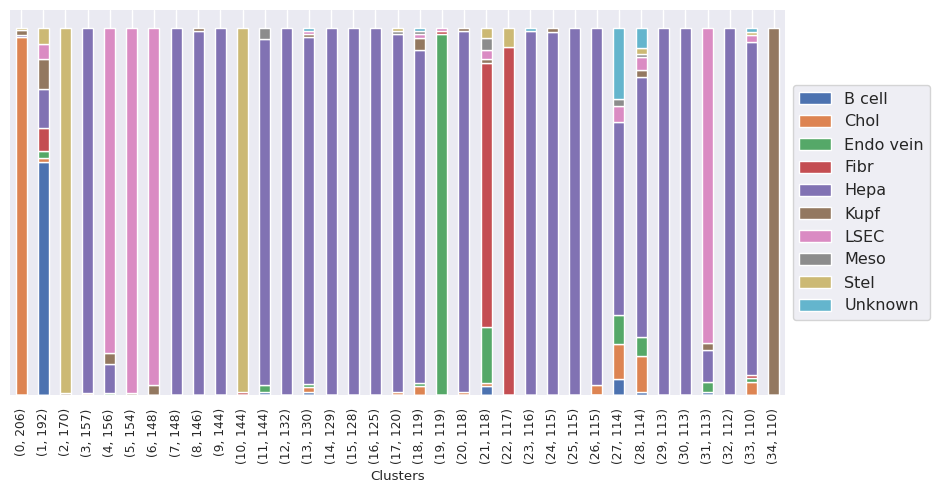

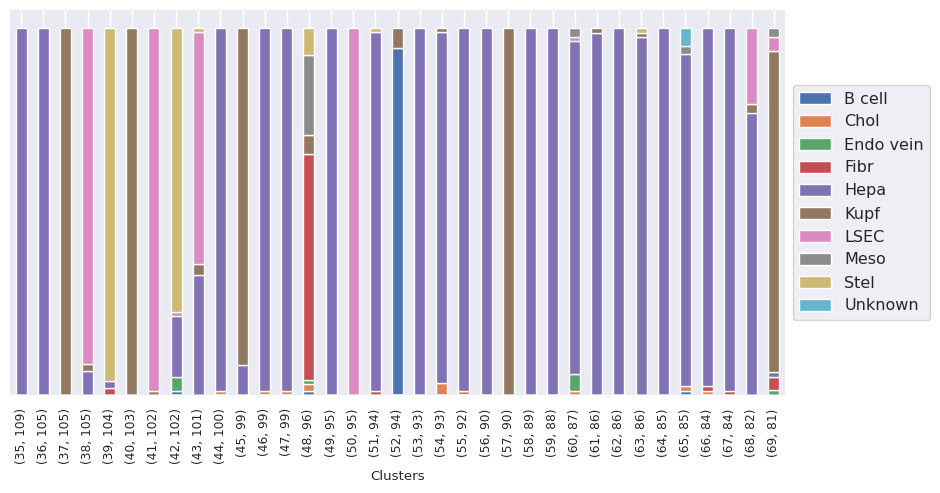

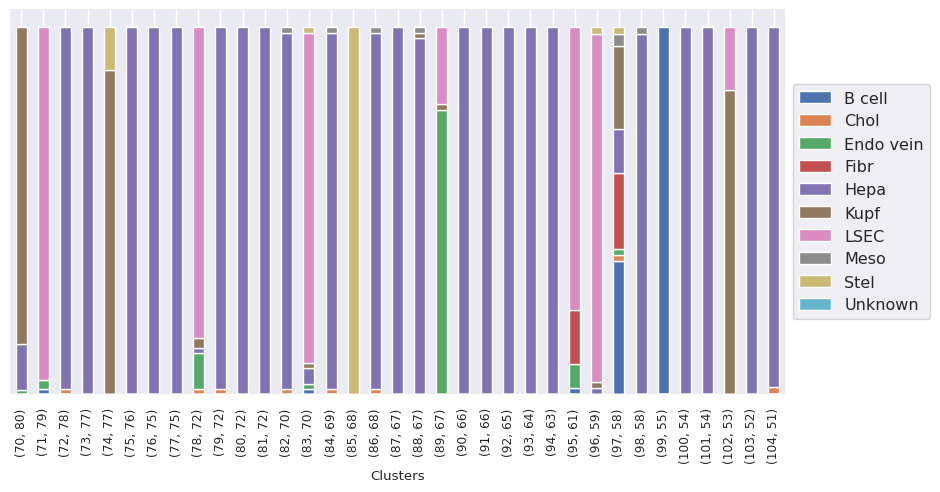

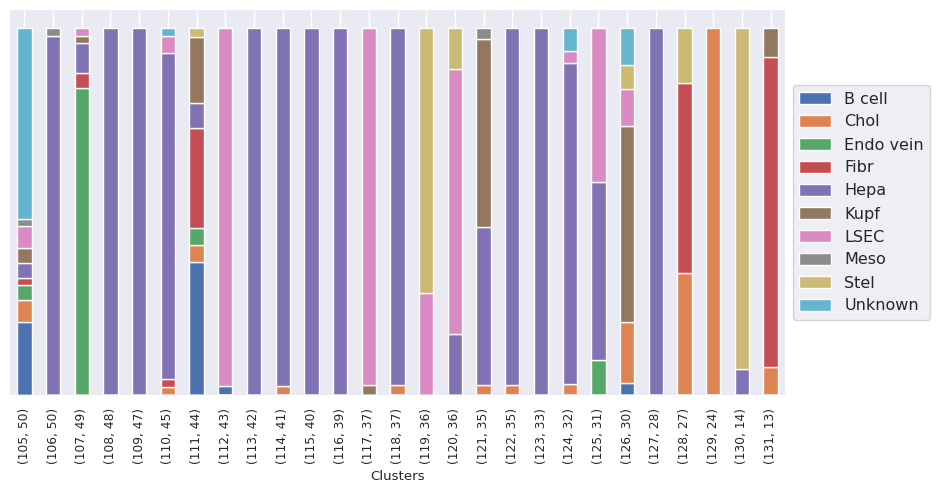

In [18]:
cell_types = ['Hepa','Kupf','LSEC','Endo vein','Fibr','Stel','Meso','Chol','B cell','Unknown']
leiden_clusters_per_ct = clusteringVSleiden(sdata.table, "annotation_own_score_genes", "leiden",cell_types)

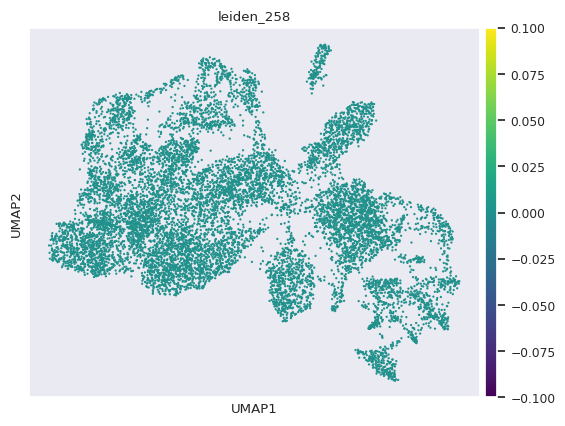

In [19]:
sdata.table.obs['leiden_258'] = (sdata.table.obs['leiden'] == '258').astype(int)
sc.pl.umap(sdata.table,color=['leiden_258'],color_map='viridis')

In [20]:
a = sdata.table.obs['leiden']
i = 0
for putative_leiden_clusters in leiden_clusters_per_ct:
    L = [str(x) for x in putative_leiden_clusters]
    for n in L:
        a = a.replace(n,cell_types[i])
    i += 1
sdata.table.obs['leiden_cell_types'] = a
# cells per leiden_cell_type cluster, to see the max number of n_cells you can take per cluster (149 in this case)
print(sdata.table.obs['leiden_cell_types'].value_counts())
min_cells_per_leiden_cell_type = sdata.table.obs['leiden_cell_types'].value_counts().min()
print(min_cells_per_leiden_cell_type)

Hepa         6936
LSEC         1431
Kupf          863
Stel          638
Fibr          371
B cell        341
Endo vein     235
Chol          230
Unknown       183
Name: leiden_cell_types, dtype: int64
183


230


Summary:
Hepa
Maybe drop:[['Glul', 'Endo vein']]
Fibr
Maybe drop:[['Fn1', 'Hepa'], ['Cxcl12', 'Hepa'], ['Hgf', 'LSEC'], ['Plpp1', 'Endo vein'], ['Fn1', 'Stel'], ['Fn1', 'Chol']]
Stel
Maybe drop:[['Fn1', 'Hepa'], ['Plpp1', 'Endo vein'], ['Axl', 'Fibr'], ['Lpl', 'Fibr'], ['Plpp1', 'Fibr']]
Chol
Maybe drop:[['Fn1', 'Hepa']]
Kupf
Maybe drop:[['Cd36', 'LSEC'], ['Plpp1', 'Endo vein'], ['Plpp1', 'Fibr'], ['Pecam1', 'B cell']]
LSEC
Maybe drop:[['Adgrg6', 'Endo vein'], ['Adgrg6', 'Chol']]
Summary:
Hepa
Maybe drop:[['Glul', 'Endo vein']]
Fibr
Maybe drop:[['Fn1', 'Hepa'], ['Cxcl12', 'Hepa'], ['Hgf', 'LSEC'], ['Plpp1', 'Endo vein'], ['Fn1', 'Stel'], ['Fn1', 'Chol']]
Stel
Maybe drop:[['Fn1', 'Hepa'], ['Plpp1', 'Endo vein'], ['Axl', 'Fibr'], ['Lpl', 'Fibr'], ['Plpp1', 'Fibr']]
Chol
Maybe drop:[['Fn1', 'Hepa']]
Kupf
Maybe drop:[['Cd36', 'LSEC'], ['Plpp1', 'Endo vein'], ['Plpp1', 'Fibr'], ['Pecam1', 'B cell']]
LSEC
Maybe drop:[['Adgrg6', 'Endo vein'], ['Adgrg6', 'Chol']]
Summary:
Hepa
Maybe drop:[['Gl

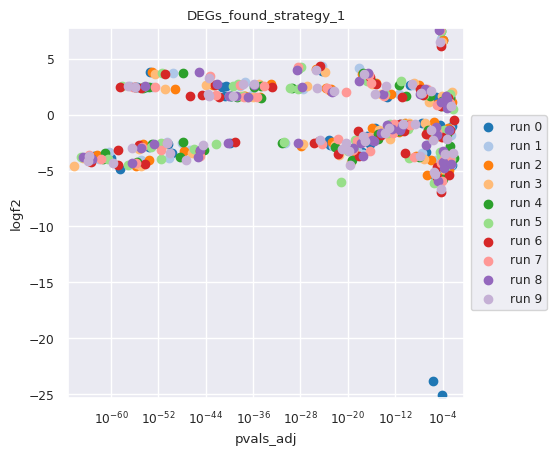

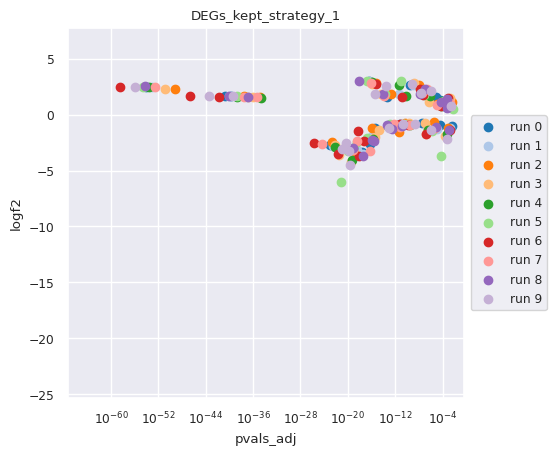

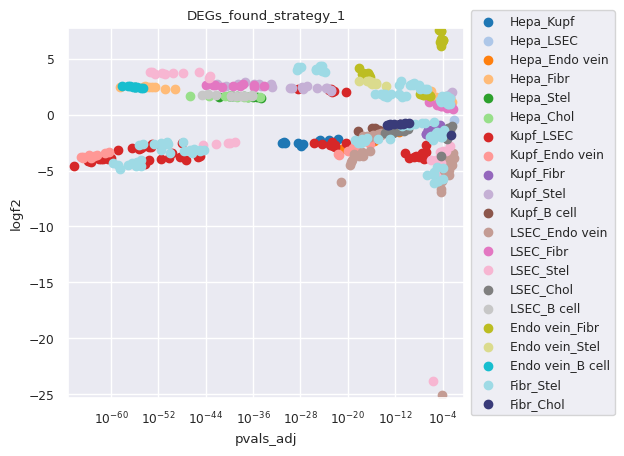

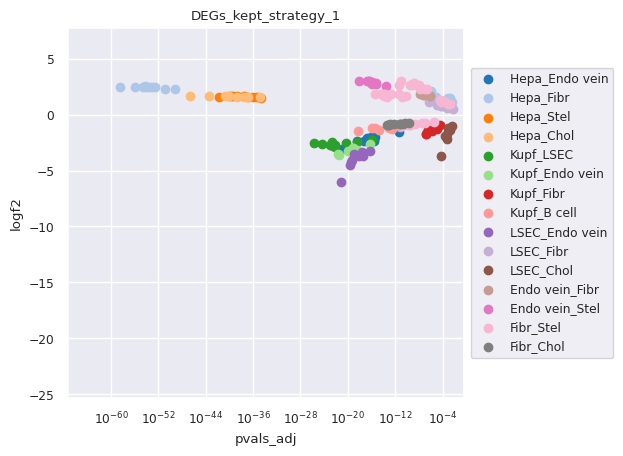

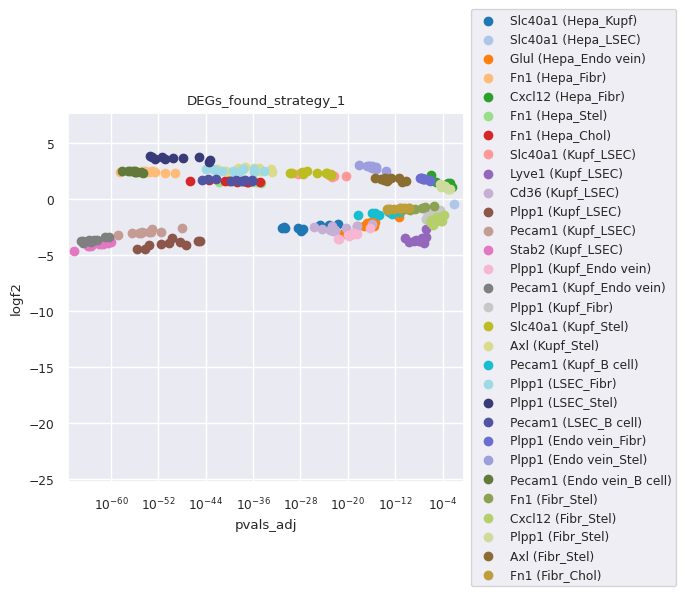

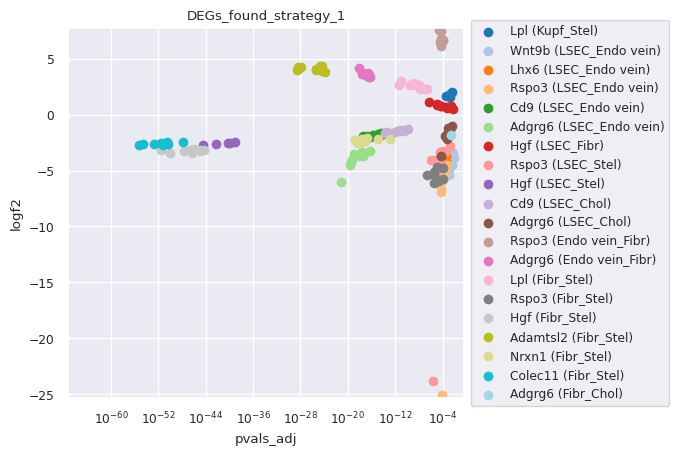

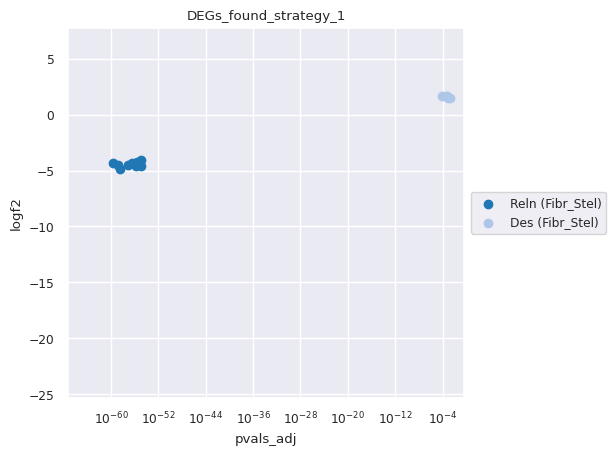

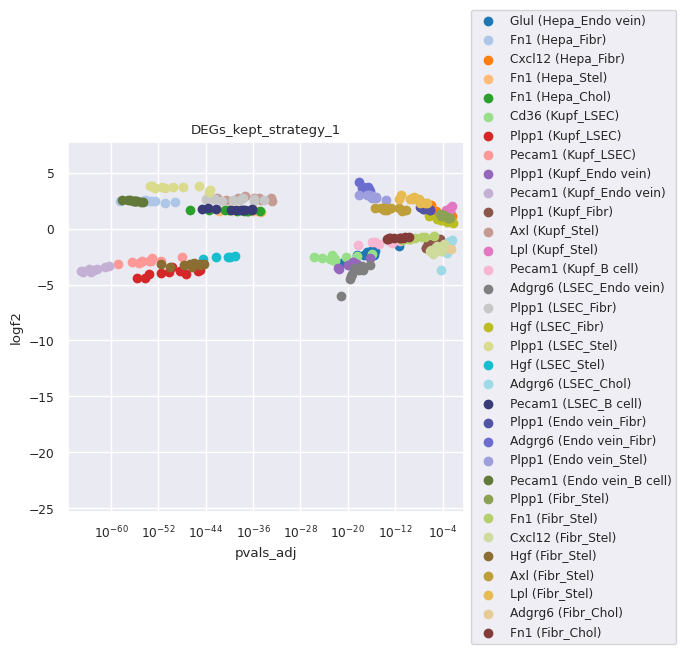

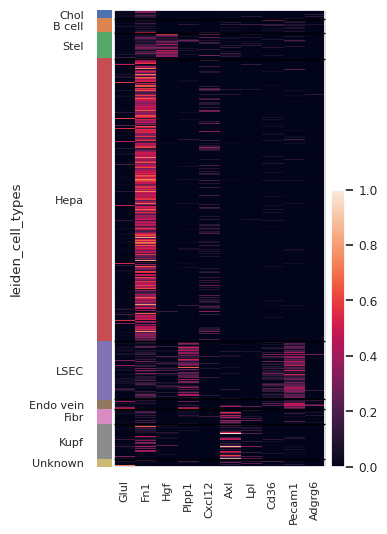

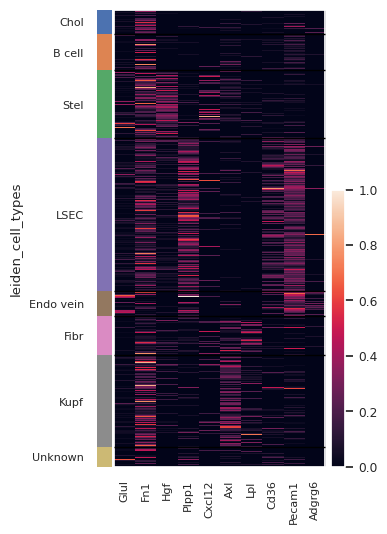

In [21]:
# STRATEGY 1 to change the marker gene list
results_strat1_10, results_runs1_10, DEG_details_runs1_10 = Apply_strategy_multiple_times(sdata.table,cell_types,leiden_clusters_per_ct,path_mg,10,1)

In [22]:
# Update marker gene list based on STRATEGY 1:
df_mg = pd.read_csv(path_mg,index_col=0)
keys = results_strat1_10.keys()
for key in keys:
    f = [x[0] for x in results_strat1_10[key]]
    f = np.unique(f).tolist()
    df_mg.loc[f,key] = 0
df_mg.to_csv("/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL_modified1.csv")

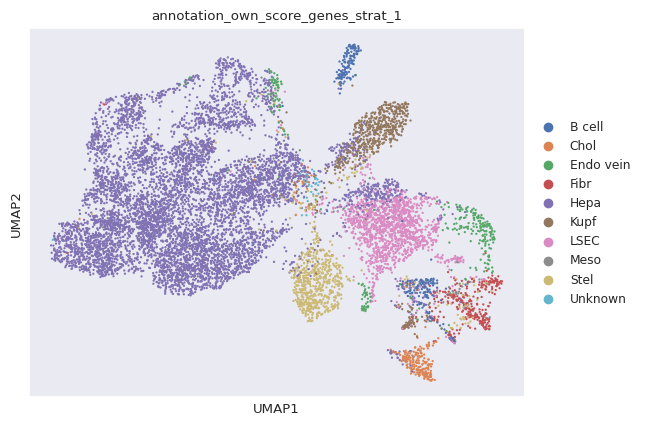

               atlas
B cell      0.621451
Chol        2.673310
Hepa       57.998500
Kupf        3.203686
LSEC        9.241401
Meso        2.796528
Endo vein   3.166185
Fibr        3.042966
Stel       13.768349
Unknown     3.487625
           annotation_own_score_genes_strat_1
B cell                               2.529391
Chol                                 2.173139
Endo vein                            2.814393
Fibr                                 2.680798
Hepa                                64.027431
Kupf                                 5.806911
LSEC                                12.673673
Meso                                 0.534378
Stel                                 6.421446
Unknown                              0.338440


In [23]:
# Own score genes with modified marker gene list based on STRATREGY 1
path_mg_mod1 = "/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL_modified1.csv"
scores = own_score_genes(sdata.table,path_mg_mod1,suffix='_strat_1')
visualize_classification(sdata,'annotation_own_score_genes_strat_1','umap_23_15',path_mg_mod1,plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)

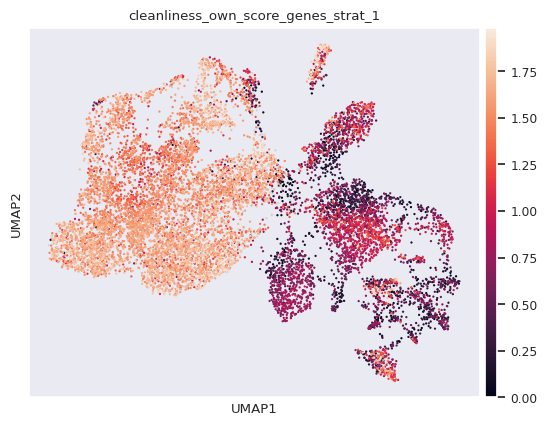

In [24]:
sc.pl.umap(sdata.table,color=['cleanliness_own_score_genes_strat_1'])

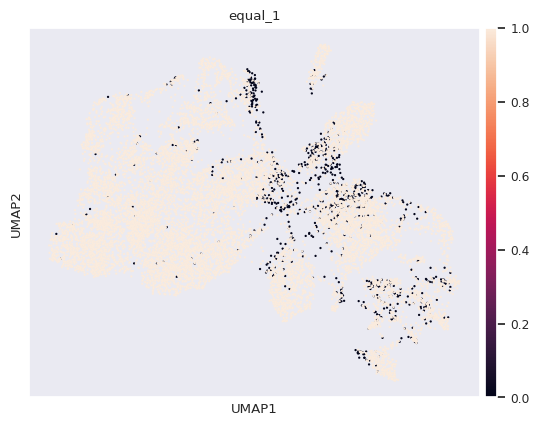

In [25]:
l = [sdata.table.obs['annotation_own_score_genes'].to_list()[i] == sdata.table.obs['annotation_own_score_genes_strat_1'].to_list()[i] for i in range(len(sdata.table.obs['annotation_own_score_genes'].to_list()))]
# list with True False to 0 1
sdata.table.obs['equal_1'] = [int(i) for i in l]
sc.pl.umap(sdata.table,color=['equal_1'])

Hepa          8.002
LSEC          8.833
Endo vein     7.250
Chol          6.500
Kupf         18.000
Stel         13.501
Fibr         14.625
B cell        4.500
Meso          6.000
dtype: float64


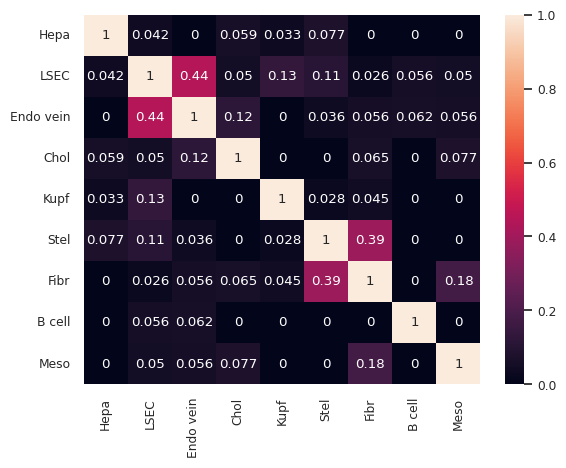

In [26]:
Jaccard_similarity_matrix(path_mg_mod1)

230
Ccr2
Is marker gene of: []
Could also be a marker gene of: ['B cell']
Cd36
Is marker gene of: ['LSEC', 'Kupf']
Could also be a marker gene of: ['Endo vein']
Cd3e
Is marker gene of: []
Could also be a marker gene of: ['B cell']
Clec9a
Is marker gene of: []
Could also be a marker gene of: ['Kupf', 'LSEC']
Cx3cr1
Is marker gene of: []
Could also be a marker gene of: ['Chol']
Cyp2e1
Is marker gene of: ['Hepa']
Could also be a marker gene of: ['Kupf', 'LSEC', 'Stel']
Dpt
Is marker gene of: ['Fibr']
Could also be a marker gene of: ['Chol']
Gdf15
Is marker gene of: ['Kupf']
Could also be a marker gene of: ['LSEC']
Ghr
Is marker gene of: ['Hepa']
Could also be a marker gene of: ['LSEC', 'Stel']
Gls2
Is marker gene of: ['Hepa']
Could also be a marker gene of: ['LSEC']
Myh11
Is marker gene of: ['Stel']
Could also be a marker gene of: ['Endo vein', 'Fibr']
Ngfr
Is marker gene of: ['Stel']
Could also be a marker gene of: ['LSEC', 'B cell']
Pck1
Is marker gene of: ['Hepa']
Could also be a marke

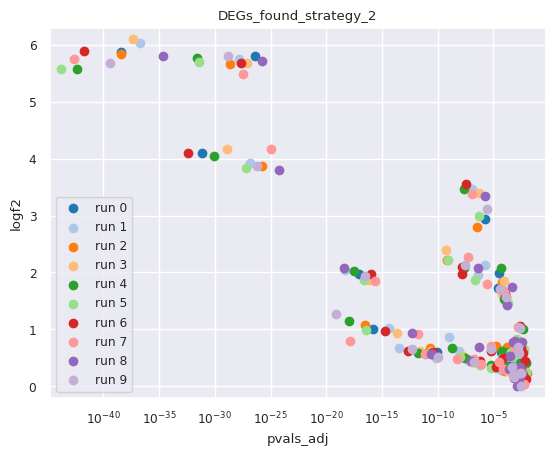

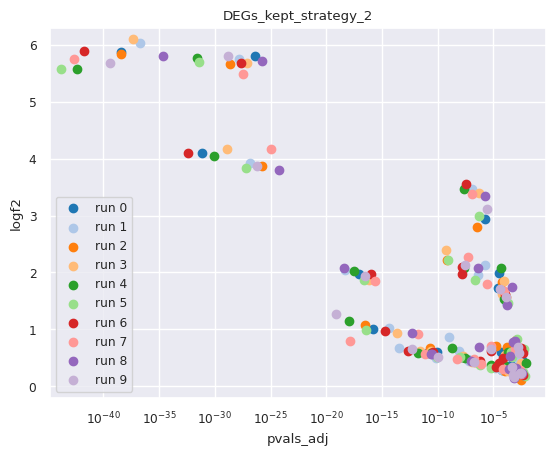

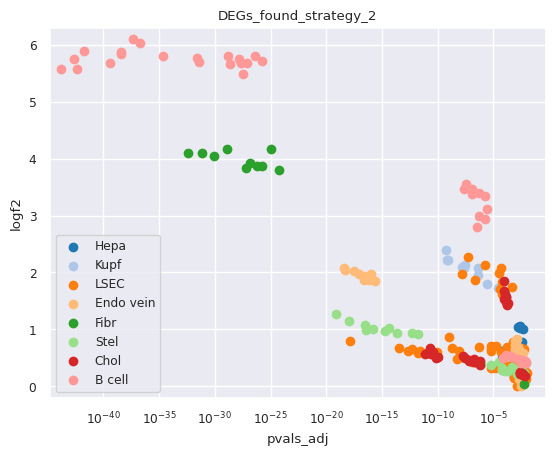

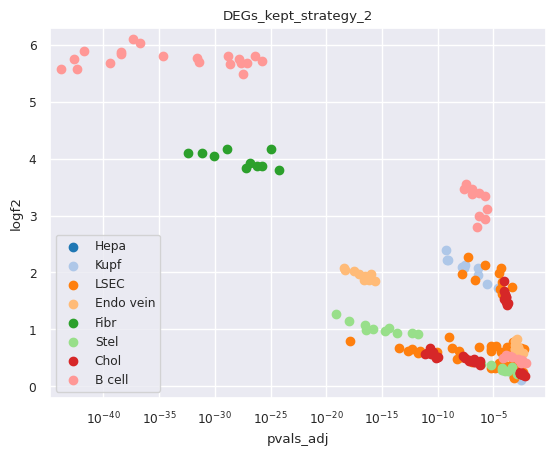

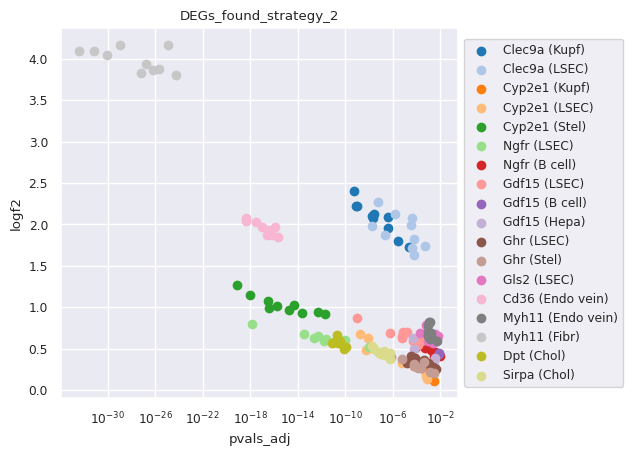

...

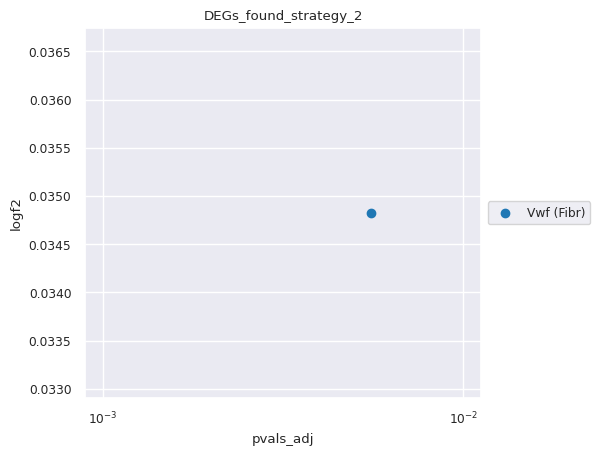

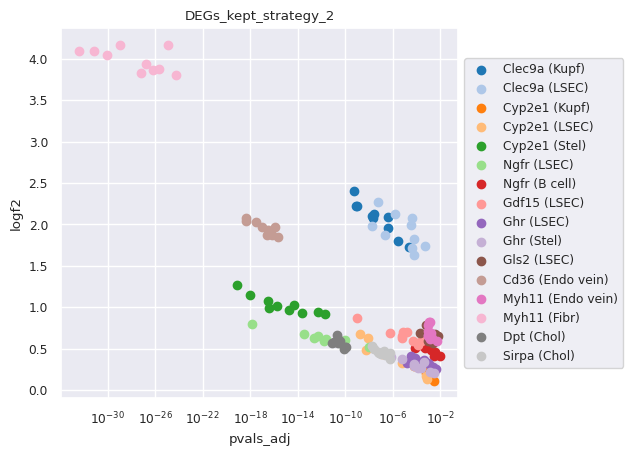

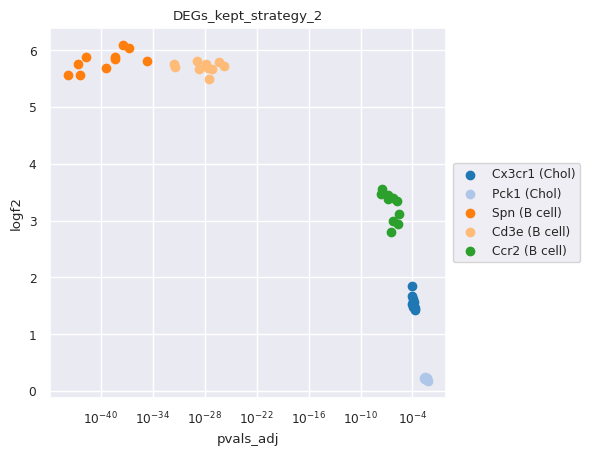

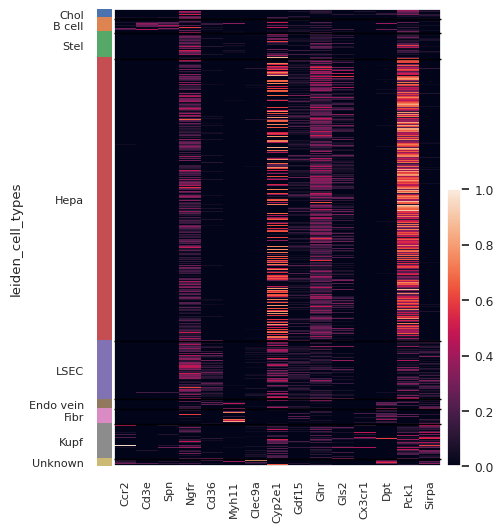

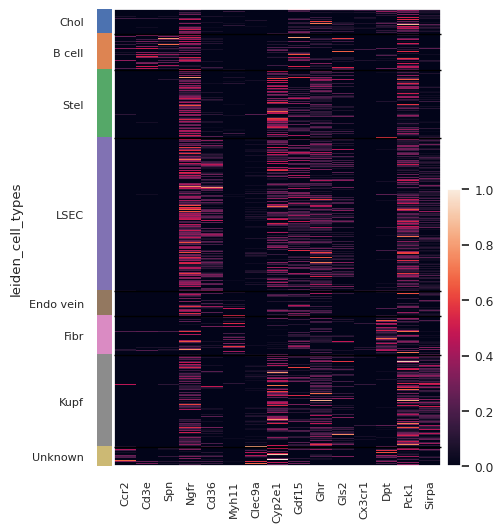

In [27]:
# STRATEGY 2 to change the marker gene list
results_strat2_10, results_runs2_10, DEG_details_runs2_10 = Apply_strategy_multiple_times(sdata.table,cell_types,leiden_clusters_per_ct,path_mg,10,2)

In [28]:
# Update marker gene list based on STRATEGY 2:
df_mg = pd.read_csv(path_mg,index_col=0)
keys = results_strat2_10.keys()
for key in keys:
    df_mg.loc[results_strat2_10[key],key] = 1
df_mg.to_csv("/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL_modified2.csv")

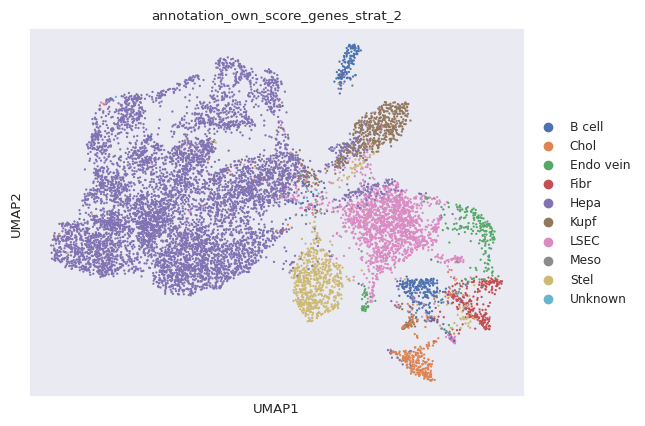

               atlas
B cell      0.621451
Chol        2.673310
Hepa       57.998500
Kupf        3.203686
LSEC        9.241401
Meso        2.796528
Endo vein   3.166185
Fibr        3.042966
Stel       13.768349
Unknown     3.487625
           annotation_own_score_genes_strat_2
B cell                               3.615960
Chol                                 2.645173
Endo vein                            2.235483
Fibr                                 2.253295
Hepa                                62.548985
Kupf                                 5.397221
LSEC                                14.739936
Meso                                 0.374065
Stel                                 6.100819
Unknown                              0.089063


In [29]:
# Own score genes with modified marker gene list based on STRATREGY 2
path_mg_mod2 = "/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL_modified2.csv"
scores = own_score_genes(sdata.table,path_mg_mod2,suffix='_strat_2')
visualize_classification(sdata,'annotation_own_score_genes_strat_2','umap_23_15',path_mg_mod2,plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)

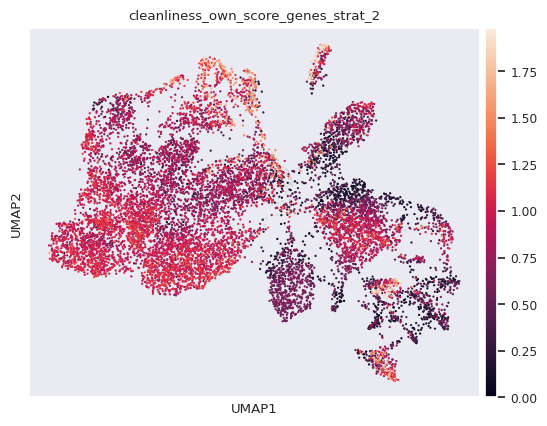

In [30]:
sc.pl.umap(sdata.table,color=['cleanliness_own_score_genes_strat_2'])
# makes sense that this becomes worse, because more marker genes overlap between cell types
# but does not mean that the annotation is worse

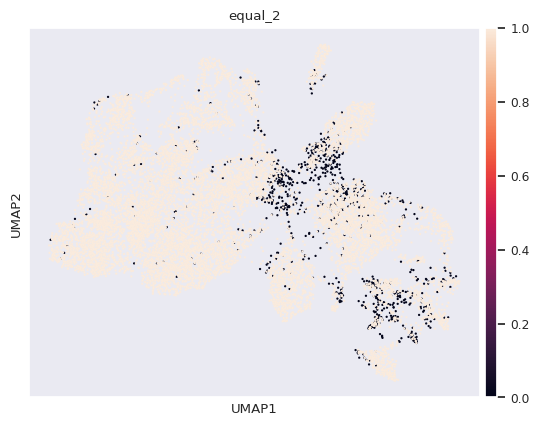

In [31]:
l = [sdata.table.obs['annotation_own_score_genes'].to_list()[i] == sdata.table.obs['annotation_own_score_genes_strat_2'].to_list()[i] for i in range(len(sdata.table.obs['annotation_own_score_genes'].to_list()))]
# list with True False to 0 1
sdata.table.obs['equal_2'] = [int(i) for i in l]
sc.pl.umap(sdata.table,color=['equal_2'])

Hepa          8.669
LSEC         15.333
Endo vein     9.250
Chol         11.500
Kupf         21.500
Stel         18.001
Fibr         18.625
B cell        8.500
Meso          6.000
dtype: float64


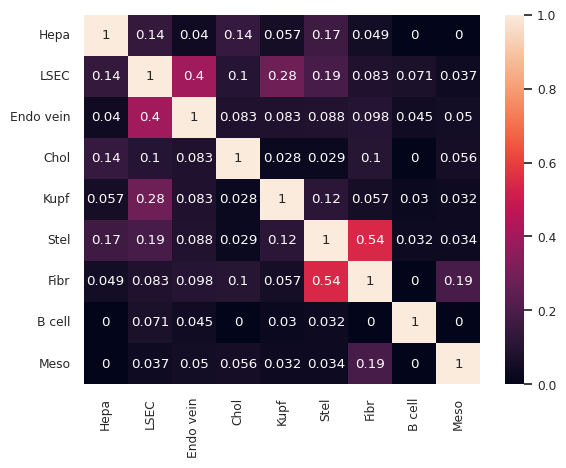

In [32]:
Jaccard_similarity_matrix(path_mg_mod2)

In [33]:
# STRATEGY 1 and STRATEGY 2 combined to change the marker gene list

In [34]:
# Update marker gene list based on STRATEGY 1 and STRATEGY 2:
df_mg = pd.read_csv(path_mg,index_col=0)
keys = results_strat1_10.keys()
for key in keys:
    f = [x[0] for x in results_strat1_10[key]]
    f = np.unique(f).tolist()
    df_mg.loc[f,key] = 0
keys = results_strat2_10.keys()
for key in keys:
    df_mg.loc[results_strat2_10[key],key] = 1
df_mg.to_csv("/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL_modified_1_2.csv")

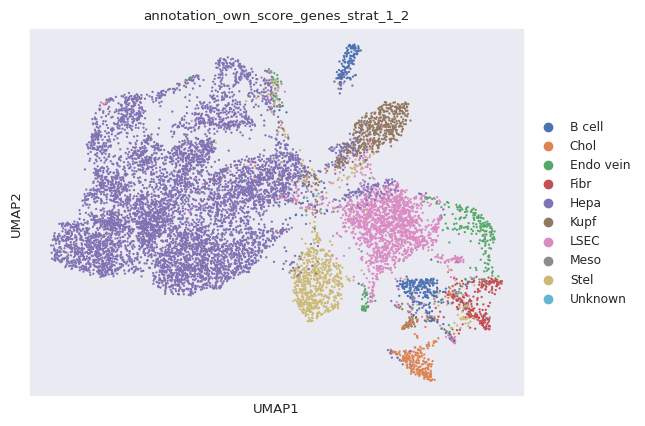

               atlas
B cell      0.621451
Chol        2.673310
Hepa       57.998500
Kupf        3.203686
LSEC        9.241401
Meso        2.796528
Endo vein   3.166185
Fibr        3.042966
Stel       13.768349
Unknown     3.487625
           annotation_own_score_genes_strat_1_2
B cell                                 3.615960
Chol                                   2.573922
Endo vein                              2.556110
Fibr                                   2.235483
Hepa                                  62.085857
Kupf                                   5.147845
LSEC                                  14.775561
Meso                                   0.472034
Stel                                   6.492697
Unknown                                0.044532


In [35]:
# Own score genes with modified marker gene list based on STRATREGY 1 and STRATEGY 2
path_mg_mod_1_2 = "/home/wout/Documents/Thesis_lokaal/Mouse_Liver_Resolve_Data/markerGeneListHL_modified_1_2.csv"
scores = own_score_genes(sdata.table,path_mg_mod_1_2,suffix='_strat_1_2')
visualize_classification(sdata,'annotation_own_score_genes_strat_1_2','umap_23_15',path_mg_mod_1_2,plot_dot_plot=False,plot_rank_genes_groups=False,plot_image=False)

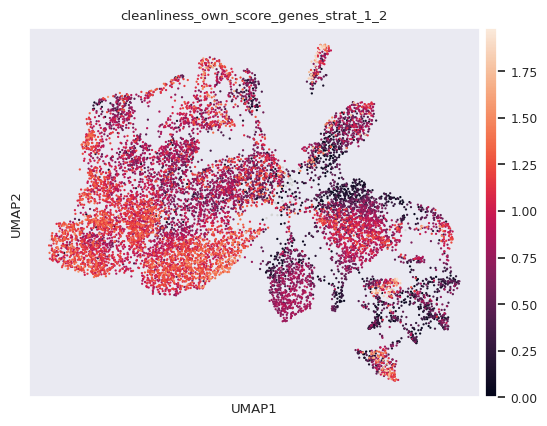

In [36]:
sc.pl.umap(sdata.table,color=['cleanliness_own_score_genes_strat_1_2'])

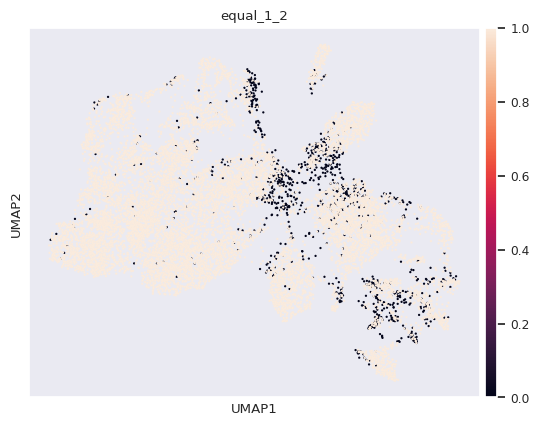

In [37]:
l = [sdata.table.obs['annotation_own_score_genes'].to_list()[i] == sdata.table.obs['annotation_own_score_genes_strat_1_2'].to_list()[i] for i in range(len(sdata.table.obs['annotation_own_score_genes'].to_list()))]
# list with True False to 0 1
sdata.table.obs['equal_1_2'] = [int(i) for i in l]
sc.pl.umap(sdata.table,color=['equal_1_2'])

Hepa          8.002
LSEC         14.833
Endo vein     9.250
Chol         10.500
Kupf         20.000
Stel         15.501
Fibr         15.625
B cell        8.500
Meso          6.000
dtype: float64


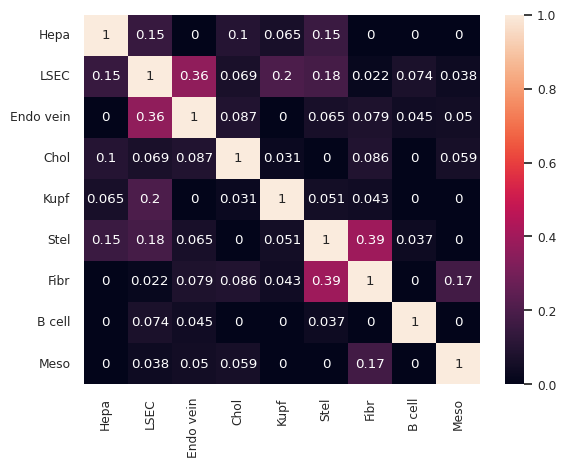

In [38]:
Jaccard_similarity_matrix(path_mg_mod_1_2)

Hepa         0.620859
LSEC         0.147756
Stel         0.064927
Kupf         0.051478
B cell       0.036160
Chol         0.025739
Endo vein    0.025561
Fibr         0.022355
Meso         0.004720
Unknown      0.000445
Name: annotation_own_score_genes, dtype: float64


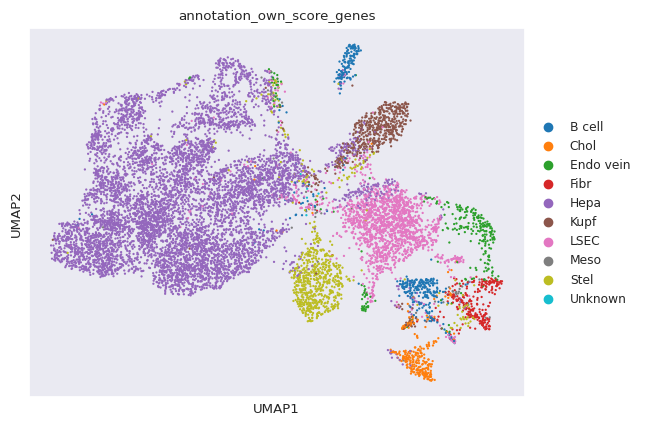

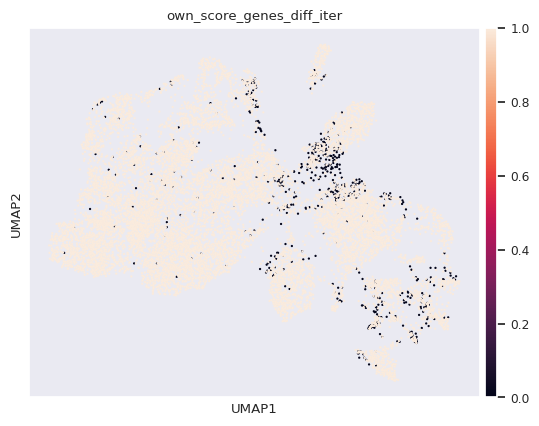

0.05245814036337727


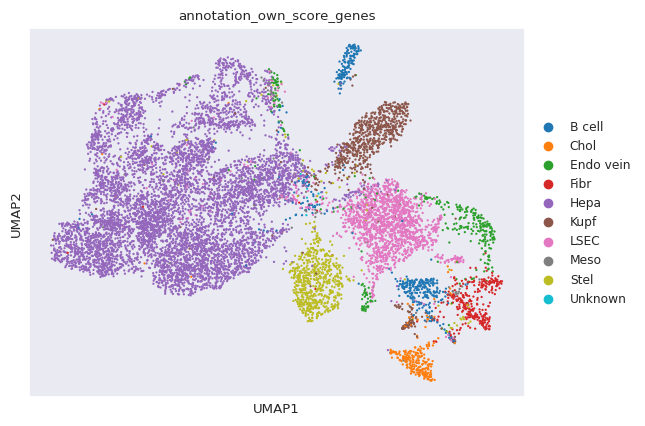

Hepa         0.598771
LSEC         0.141699
Kupf         0.069291
Stel         0.059583
B cell       0.042216
Endo vein    0.030281
Fibr         0.028055
Chol         0.023780
Meso         0.005878
Unknown      0.000445
Name: annotation_own_score_genes, dtype: float64


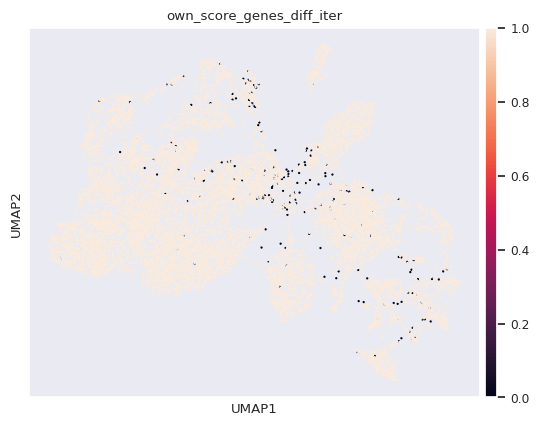

0.01790167438546491


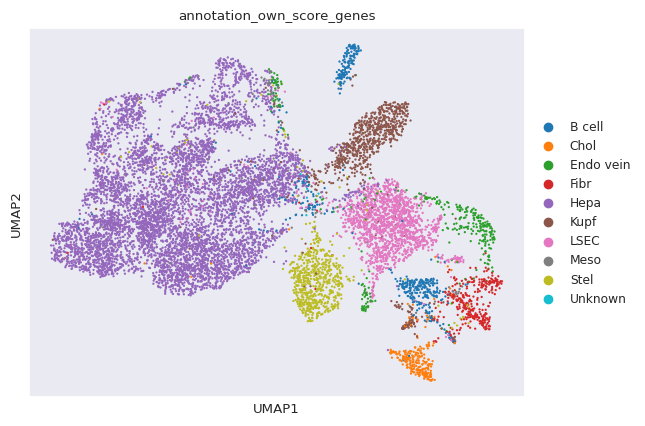

Hepa         0.592804
LSEC         0.135465
Kupf         0.074724
Stel         0.059761
B cell       0.046135
Fibr         0.029925
Endo vein    0.029569
Chol         0.023780
Meso         0.007392
Unknown      0.000445
Name: annotation_own_score_genes, dtype: float64


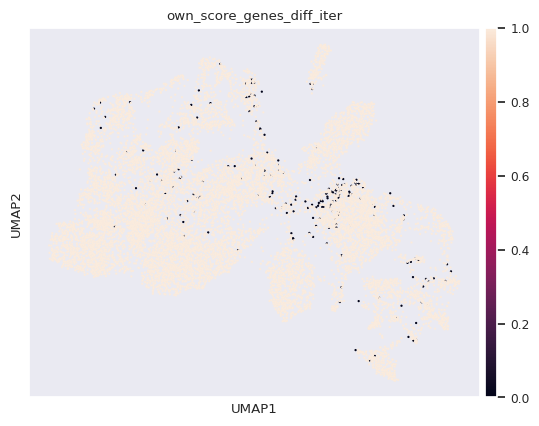

0.01701104381902387


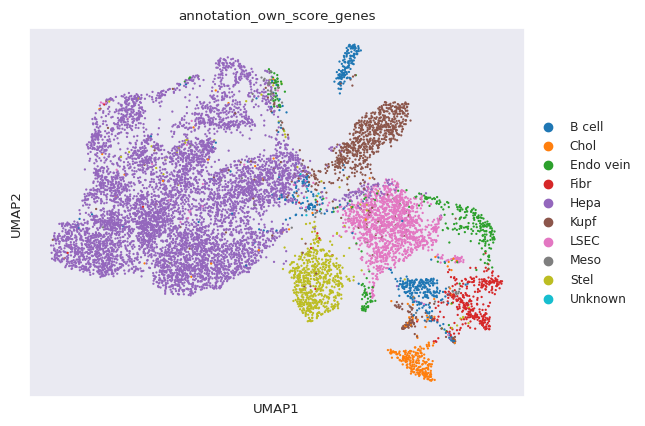

Hepa         0.598504
LSEC         0.124866
Kupf         0.078019
Stel         0.058782
B cell       0.047292
Fibr         0.031261
Endo vein    0.028500
Chol         0.026095
Meso         0.006234
Unknown      0.000445
Name: annotation_own_score_genes, dtype: float64


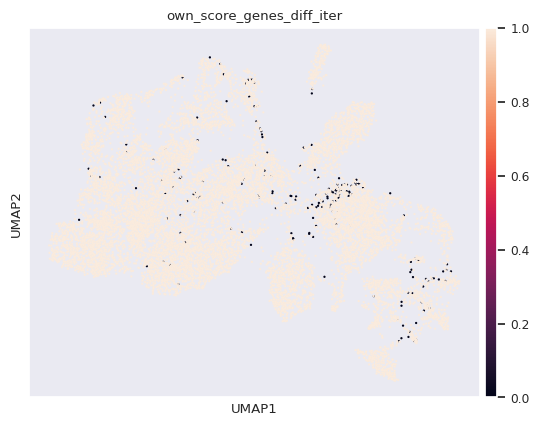

0.01612041325258283


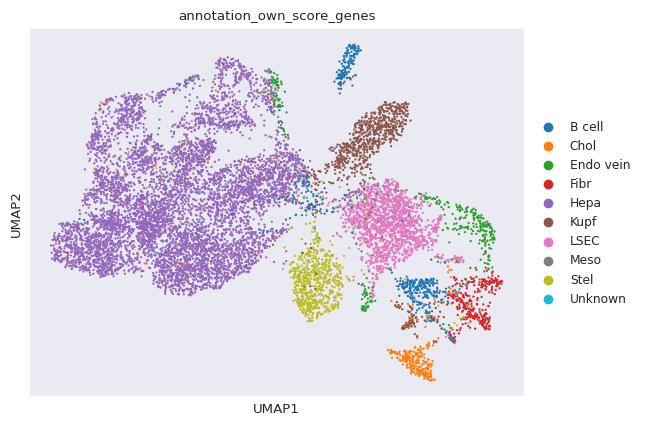

Hepa         0.589954
LSEC         0.132882
Kupf         0.079355
Stel         0.057624
B cell       0.046491
Endo vein    0.031172
Fibr         0.028589
Chol         0.026452
Meso         0.007036
Unknown      0.000445
Name: annotation_own_score_genes, dtype: float64


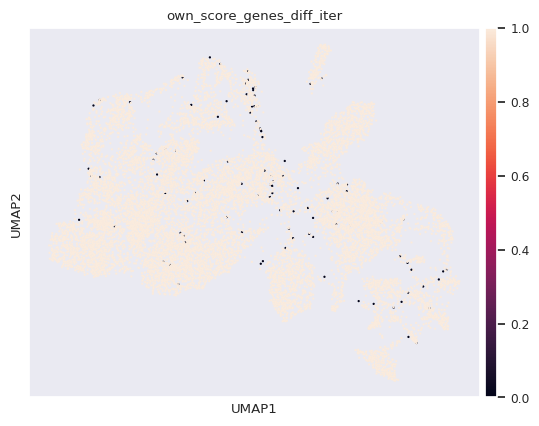

0.008995368721054506


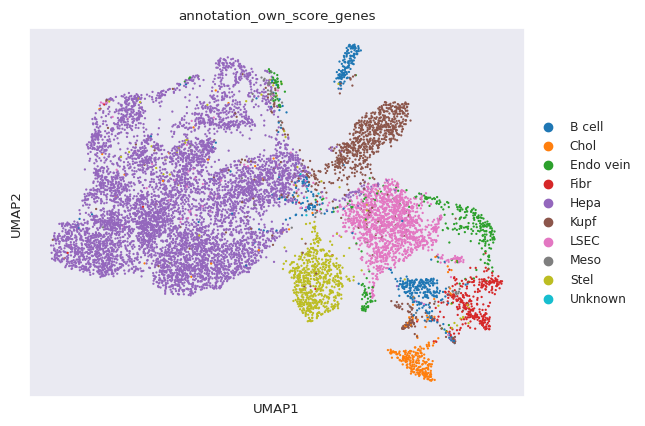

Hepa         0.590399
LSEC         0.131368
Kupf         0.082740
Stel         0.059672
B cell       0.045066
Endo vein    0.029836
Fibr         0.029213
Chol         0.025650
Meso         0.005611
Unknown      0.000445
Name: annotation_own_score_genes, dtype: float64


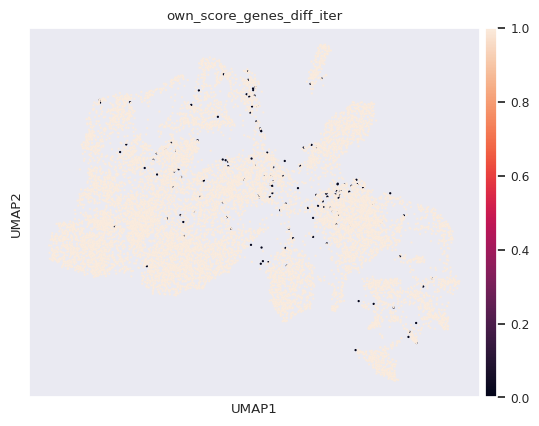

0.01193444959030994


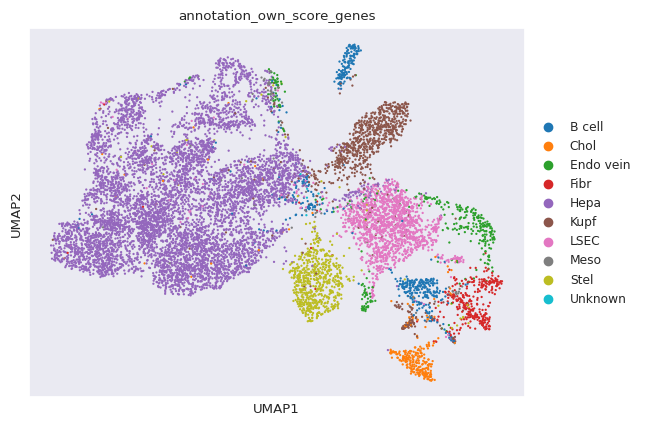

Hepa         0.597346
LSEC         0.130032
Kupf         0.077663
Stel         0.057446
B cell       0.045867
Endo vein    0.029836
Fibr         0.029480
Chol         0.025472
Meso         0.006413
Unknown      0.000445
Name: annotation_own_score_genes, dtype: float64


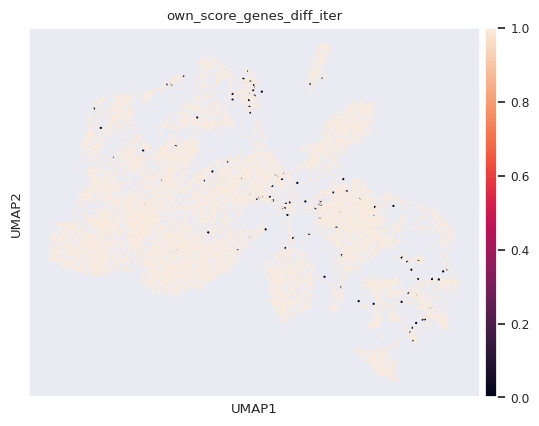

0.009173494834342715


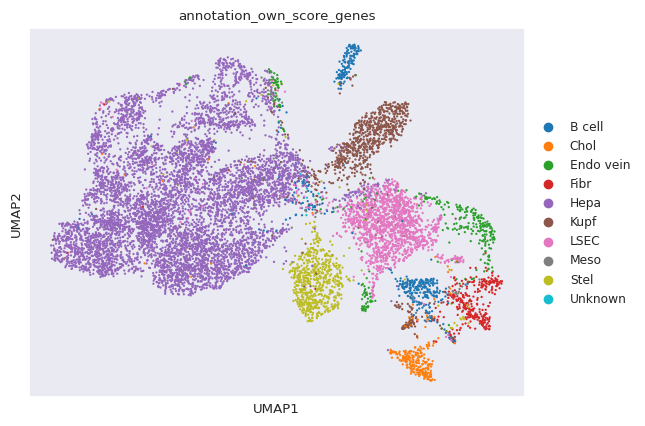

Hepa         0.599662
LSEC         0.133951
Kupf         0.076950
Stel         0.057802
B cell       0.042839
Endo vein    0.030014
Fibr         0.027966
Chol         0.025027
Meso         0.005344
Unknown      0.000445
Name: annotation_own_score_genes, dtype: float64


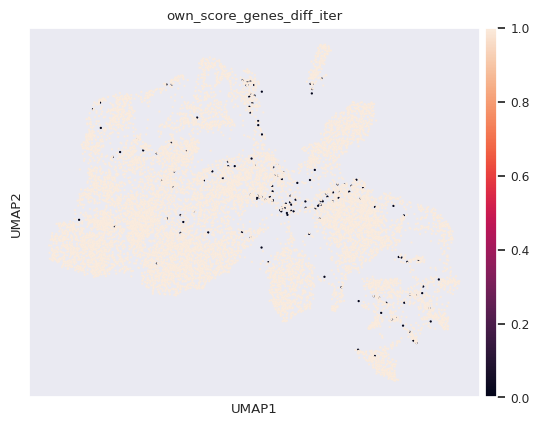

0.013448521553259709


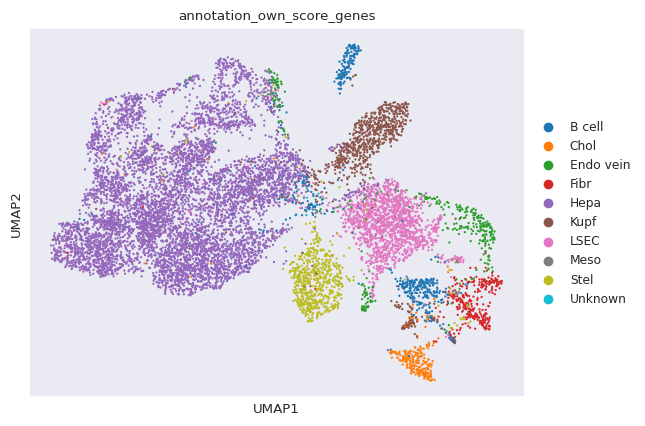

Hepa         0.595832
LSEC         0.132081
Kupf         0.076594
Stel         0.058514
B cell       0.049519
Endo vein    0.031172
Fibr         0.027877
Chol         0.024492
Meso         0.003473
Unknown      0.000445
Name: annotation_own_score_genes, dtype: float64


[0.05245814036337727,
 0.01790167438546491,
 0.01701104381902387,
 0.01612041325258283,
 0.008995368721054506,
 0.01193444959030994,
 0.009173494834342715,
 0.013448521553259709]

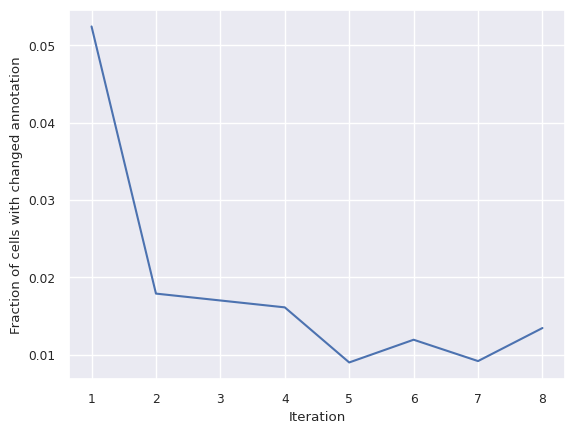

In [39]:
# Own score genes iterative with basic marker gene list updated with strategy 1 and 2
own_score_genes_iterative(sdata.table,path_mg_mod_1_2,nr_iterations=8)